# __Foundations of Machine Learning Group Project__
## Velon Murugathas 8938776
## Periyanayagi Christina 8938218

# __Monkey species identifyer__

* Objective :- Identifying the species of the monkeys using image classification
* Dataset :- Obtained from Kaggle, which was published for a coding competition (https://www.kaggle.com/datasets/slothkong/10-monkey-species)
* There are 10 classes in the dataset, each of them containing around roughly around 100 images.

### Importing necessary libraries

In [33]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix

### Counting the number of images per each class for the Monkey Species dataset

In [34]:
dataset_path = r'C:\Users\User\Downloads\Monkey Species\training'                   # Setting the path to the dataset

class_counts = {}                                                                   # Initializing a dictionary to store the count of images per class

for class_folder in os.listdir(dataset_path):                                       # Iterating through each class folder (n0 to n9)
    class_path = os.path.join(dataset_path, class_folder)

    if os.path.isdir(class_path):                                                   # Checking if the path is a directory

        num_images = len(os.listdir(class_path))                                    # Counting the number of images in the class folder

        class_counts[class_folder] = num_images                                     # Storing the count in the dictionary

for class_name, count in class_counts.items():                                      # Displaying the count of images per class
    print(f"Class '{class_name}' has {count} images.")

Class 'n0' has 105 images.
Class 'n1' has 111 images.
Class 'n2' has 110 images.
Class 'n3' has 122 images.
Class 'n4' has 105 images.
Class 'n5' has 113 images.
Class 'n6' has 106 images.
Class 'n7' has 114 images.
Class 'n8' has 106 images.
Class 'n9' has 106 images.


### Exploring the data for each class

In [35]:
# Data Exploration
def visualize_sample_images(dataset_path, num_samples_per_class=3):
    class_folders = os.listdir(dataset_path)                   # Get a list of class folders in the dataset path
    
    for class_folder in class_folders:                         # Iterate through each class folder
        class_path = os.path.join(dataset_path, class_folder)  # Construct the full path to the current class folder
        if os.path.isdir(class_path):                          # Check if the path corresponds to a directory
            image_files = os.listdir(class_path)[:num_samples_per_class] # Get a list of image files in the class folder and limit to a specified number
            
            for img_file in image_files:                         # Iterate through each image file in the class
                img_path = os.path.join(class_path, img_file)    # Construct the full path to the current image
                img = image.load_img(img_path)                   # Load the image using Keras' image.load_img
                plt.imshow(img)                                  # Display the image using matplotlib
                plt.title(f"Class: {class_folder}")              # Set the title of the plot to include the class label
                plt.show()                                       # Show the plot


### Data Augmentation

In [36]:

# Data Preprocessing
def preprocess_images(dataset_path, target_size=(224, 224), batch_size=32):
    # Initialize an ImageDataGenerator for training data with various augmentation techniques
    train_datagen = ImageDataGenerator(
        rescale=1./255,                           # Rescale pixel values to the range [0, 1]
        shear_range=0.2,                          # Apply shear transformation with a shear intensity of 0.2
        # zoom_range=0.2,                         # (Optional) Apply zoom transformation with a zoom intensity of 0.2
        horizontal_flip=True,                     # Randomly flip images horizontally
        rotation_range=20,                        # Rotate images by a random angle between -20 and 20 degrees
        width_shift_range=0.2,                    # Shift images horizontally by a fraction of total width (0.2)
        height_shift_range=0.2,                   # Shift images vertically by a fraction of total height (0.2)
        fill_mode='nearest'                       # Fill in newly created pixels during transformations with the nearest pixel value
    
    )

    validation_datagen = ImageDataGenerator(rescale=1./255)  # Initialize an ImageDataGenerator for validation data with rescaling only

 # Generate a flow of batches of augmented training data
    train_generator = train_datagen.flow_from_directory(
        os.path.join(dataset_path, 'training'),    # Path to the training data
        target_size=target_size,                   # Resize images to the specified target size
        batch_size=batch_size,                     # Number of samples per batch
        class_mode='categorical'                   # Categorically encode the class labels
    )

 # Generate a flow of batches of validation data (without augmentation)
    validation_generator = validation_datagen.flow_from_directory(
        os.path.join(dataset_path, 'validation'),  # Path to the validation data
        target_size=target_size,                   # Resize images to the specified target size
        batch_size=batch_size,                     # Number of samples per batch
        class_mode='categorical'                   # Categorically encode the class labels
    )

    return train_generator, validation_generator    # Return the generators for training and validation data

### Count images per class before augmentation

In [37]:
def count_images_before_augmentation(generator):
    # Get the number of classes and total number of samples in the generator
    num_classes = generator.num_classes
    total_samples = generator.samples

    class_counts_before_augmentation = {}     # Initialize a dictionary to store the count of images per class before augmentation
    for class_index in range(num_classes):    # Iterate through each class index
        class_name = list(generator.class_indices.keys())[list(generator.class_indices.values()).index(class_index)]  # Get the class name using the class index
        class_count = sum(generator.classes == class_index) # Count the number of samples in the current class
        class_counts_before_augmentation[class_name] = class_count  # Store the count in the dictionary

    return class_counts_before_augmentation    # Return the dictionary containing counts of images per class before augmentation


# Count images per class after augmentation

In [38]:
# Count images per class after augmentation
def count_augmented_images(generator, num_batches=5):
    # Initialize a dictionary to store the count of augmented images per class
    augmented_counts = {}

    for _ in range(num_batches):                       # Iterate through a specified number of batches
        batch_images, batch_labels = generator.next()  # Get the next batch of images and labels from the generator

        for label in np.argmax(batch_labels, axis=1):  # Iterate through each label in the batch
            augmented_counts[label] = augmented_counts.get(label, 0) + 1   # Update the count of augmented images for the current label in the dictionary

    return augmented_counts                            # Return the dictionary containing counts of augmented images per class

### Building a Convolutional Neural Network (CNN)

In [39]:
def build_model(input_shape=(224, 224, 3), num_classes=10):
    base_model = VGG16(input_shape=input_shape, include_top=False, weights='imagenet')  # Create a VGG16 model with pre-trained weights on ImageNet

    for layer in base_model.layers:                     # Set all layers in the base model to be non-trainable
        layer.trainable = False

    model = Sequential()                                # Initialize a Sequential model to which layers will be added
    model.add(base_model)                               # Add the pre-trained VGG16 model as the base
    model.add(Flatten())                                # Flatten the output of the VGG16 model
    model.add(Dense(512, activation='relu'))            # Add a fully connected layer with 512 neurons and ReLU activation
    model.add(Dropout(0.5))                             # Add a dropout layer with a dropout rate of 0.5 for regularization
    model.add(Dense(num_classes, activation='softmax')) # Add the final fully connected layer with softmax activation for classification
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])  # Compile the model using the Adam optimizer, categorical crossentropy loss, and accuracy metric
    return model                                        # Return the compiled model

### Model Training

In [40]:
def train_model(model, train_generator, validation_generator, epochs=10):
    # Use the fit method to train the model
    # Steps per epoch is the number of batches to process before moving to the next epoch for training data
    # Validation steps is the number of batches to process before moving to the next epoch for validation data
    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=epochs,
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // validation_generator.batch_size
    )

    return history # Return the training history, which contains information about the training process


### Model Evaluation

In [41]:
def evaluate_model(model, validation_generator):
    # Evaluate the model on the validation generator and get validation loss and accuracy
    val_loss, val_acc = model.evaluate(validation_generator, steps=validation_generator.samples // validation_generator.batch_size)
    print("Validation Loss:", val_loss)    # Print the validation loss 
    print("Validation Accuracy:", val_acc)     # Print the validation accuracy

    # Get true labels and predicted labels for the validation data
    y_true = validation_generator.classes
    y_pred = np.argmax(model.predict(validation_generator), axis=1)

    print("Classification Report:\n", classification_report(y_true, y_pred))   # Print the classification report, which includes precision, recall, and F1-score
    print("Confusion Matrix:\n", confusion_matrix(y_true, y_pred))   # Print the confusion matrix


### Fine-tuning

In [42]:
def fine_tune_model(model, train_generator, validation_generator, unfreeze_layers=15, epochs=5):
    for layer in model.layers[0].layers[:unfreeze_layers]: # Unfreeze a specified number of layers in the base model for fine-tuning
        layer.trainable = True
   # Recompile the model with a lower learning rate for fine-tuning
    model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

    history_fine_tuned = model.fit(
        train_generator,                                                       # Training data generator
        steps_per_epoch=train_generator.samples // train_generator.batch_size, # Steps per epoch for training
        epochs=epochs,                                                         # Number of epochs for fine-tuning
        validation_data=validation_generator,                                  # Validation data generator
        validation_steps=validation_generator.samples // validation_generator.batch_size # Validation steps per epoch
    )

    return model, history_fine_tuned # Return the fine-tuned model and its training history

In [43]:
dataset_path = r'C:\Users\User\Downloads\Monkey Species'    # Define the path to the dataset directory

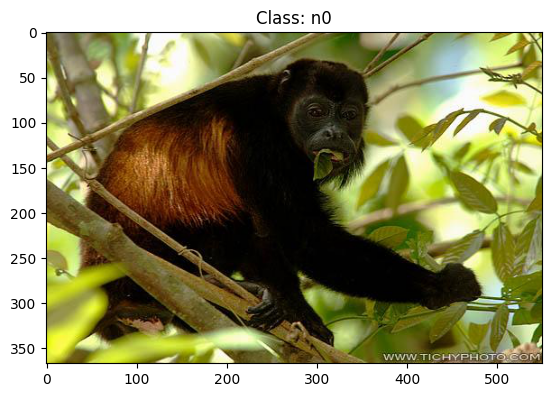

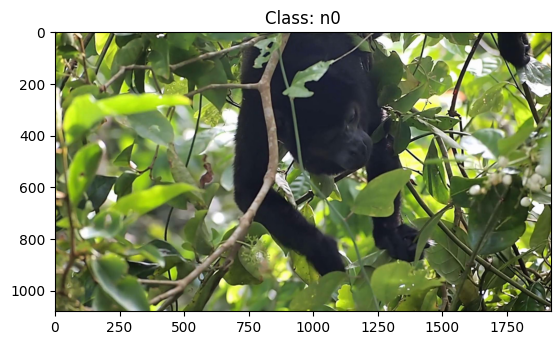

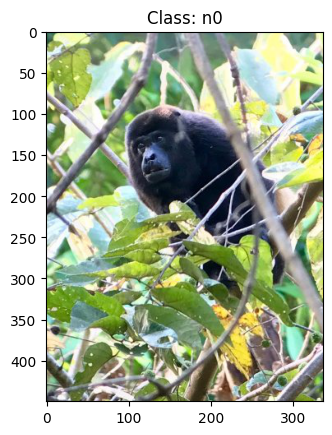

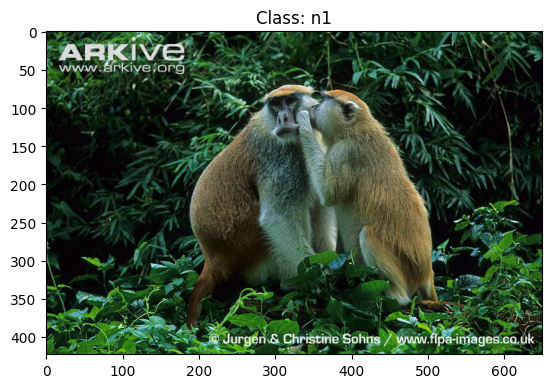

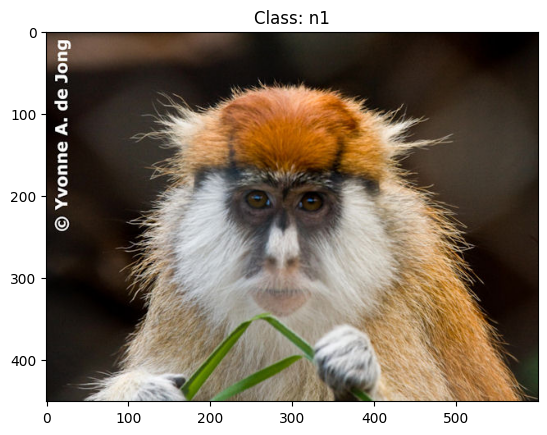

...

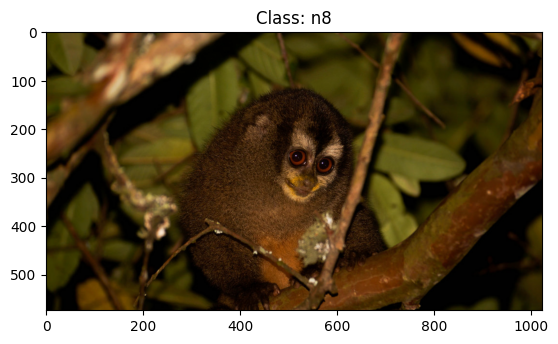

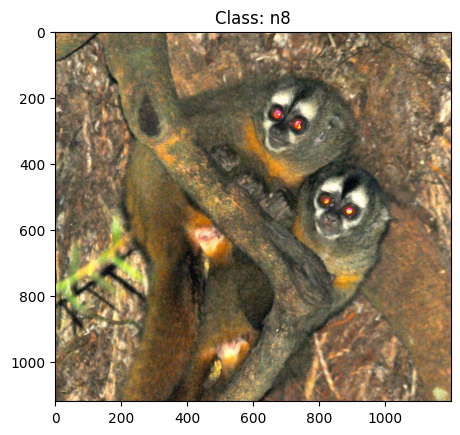

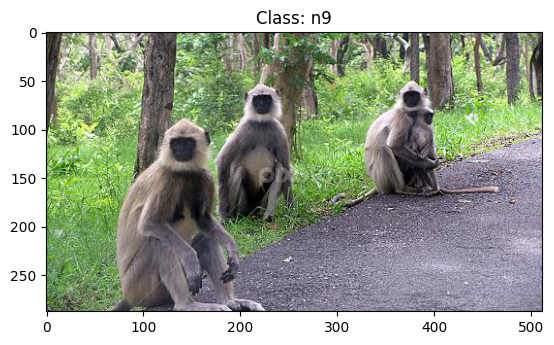

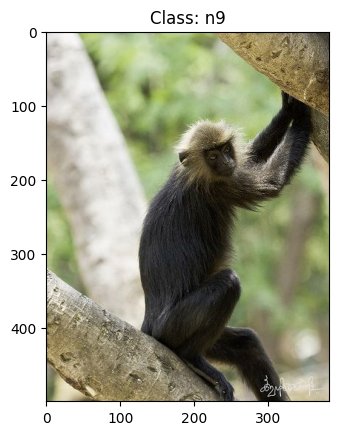

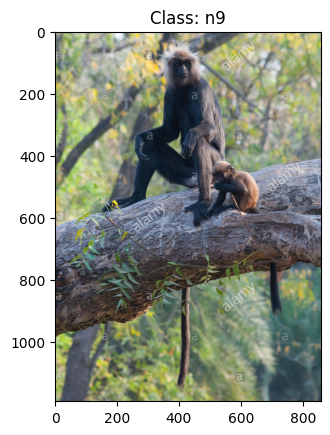

In [44]:
# Data Exploration
visualize_sample_images(os.path.join(dataset_path, 'training'))

In [45]:
# Data Preprocessing
train_generator, validation_generator = preprocess_images(dataset_path)

Found 1098 images belonging to 10 classes.
Found 272 images belonging to 10 classes.


In [46]:
# Count images per class before augmentation
print("Images per class before augmentation:")  # Print a message indicating the start of counting images per class before augmentation
class_counts_before_augmentation = count_images_before_augmentation(train_generator) # Call the count_images_before_augmentation function to get counts of images per class
print(class_counts_before_augmentation)         # Print the dictionary containing counts of images per class before augmentation

Images per class before augmentation:
{'n0': 105, 'n1': 111, 'n2': 110, 'n3': 122, 'n4': 105, 'n5': 113, 'n6': 106, 'n7': 114, 'n8': 106, 'n9': 106}


In [47]:
model = build_model()    # Building a convolutional neural network (CNN) model using VGG16 as a base model

In [48]:
history = train_model(model, train_generator, validation_generator)      # Training the pre-trained model on the training data with validation set

Epoch 1/10
34/34 [==============================] - 26s 747ms/step - loss: 2.3005 - accuracy: 0.2101 - val_loss: 1.7291 - val_accuracy: 0.4570
Epoch 2/10
34/34 [==============================] - 28s 838ms/step - loss: 1.8059 - accuracy: 0.3612 - val_loss: 1.4286 - val_accuracy: 0.5938
Epoch 3/10
34/34 [==============================] - 33s 967ms/step - loss: 1.5522 - accuracy: 0.4690 - val_loss: 1.2484 - val_accuracy: 0.6328
Epoch 4/10
34/34 [==============================] - 31s 907ms/step - loss: 1.4150 - accuracy: 0.5131 - val_loss: 1.1222 - val_accuracy: 0.6562
Epoch 5/10
34/34 [==============================] - 32s 945ms/step - loss: 1.2582 - accuracy: 0.5769 - val_loss: 0.9831 - val_accuracy: 0.7227
Epoch 6/10
34/34 [==============================] - 32s 946ms/step - loss: 1.1681 - accuracy: 0.6116 - val_loss: 0.9317 - val_accuracy: 0.7031
Epoch 7/10
34/34 [==============================] - 31s 898ms/step - loss: 1.1676 - accuracy: 0.6135 - val_loss: 0.9601 - val_accuracy: 0.6953

In [49]:
print("Images per class after augmentation:")        # Printing the count of augmented images per class after data augmentation
augmented_counts = count_augmented_images(train_generator)
print(augmented_counts)

Images per class after augmentation:
{7: 14, 1: 15, 3: 14, 4: 19, 2: 15, 9: 16, 8: 27, 6: 11, 5: 18, 0: 11}


In [50]:
evaluate_model(model, validation_generator)         # Evaluating the pre-trained model on the validation set

8/8 [==============================] - 5s 506ms/step - loss: 0.7876 - accuracy: 0.7500
Validation Loss: 0.7875874042510986
Validation Accuracy: 0.75
9/9 [==============================] - 6s 728ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.27      0.19        26
           1       0.08      0.07      0.08        28
           2       0.13      0.11      0.12        27
           3       0.13      0.20      0.16        30
           4       0.04      0.04      0.04        26
           5       0.00      0.00      0.00        28
           6       0.13      0.08      0.10        26
           7       0.06      0.07      0.06        28
           8       0.09      0.07      0.08        27
           9       0.12      0.08      0.09        26

    accuracy                           0.10       272
   macro avg       0.09      0.10      0.09       272
weighted avg       0.09      0.10      0.09       272

Confusion Matri

In [51]:
model_tuned, history_fine_tuned = fine_tune_model(model, train_generator, validation_generator)    # Fine-tune the pre-trained model on the training data with the validation set for additional epochs

Epoch 1/5
34/34 [==============================] - 51s 2s/step - loss: 0.7433 - accuracy: 0.7486 - val_loss: 0.4962 - val_accuracy: 0.8242
Epoch 2/5
34/34 [==============================] - 50s 1s/step - loss: 0.5586 - accuracy: 0.8124 - val_loss: 0.5127 - val_accuracy: 0.8203
Epoch 3/5
34/34 [==============================] - 46s 1s/step - loss: 0.4650 - accuracy: 0.8396 - val_loss: 0.3652 - val_accuracy: 0.8945
Epoch 4/5
34/34 [==============================] - 52s 2s/step - loss: 0.3787 - accuracy: 0.8612 - val_loss: 0.3777 - val_accuracy: 0.8906
Epoch 5/5
34/34 [==============================] - 40s 1s/step - loss: 0.3450 - accuracy: 0.8743 - val_loss: 0.2963 - val_accuracy: 0.8984


In [52]:
evaluate_model(model_tuned, validation_generator)           # Evaluating the fine-tuned model on the validation set

8/8 [==============================] - 4s 521ms/step - loss: 0.3070 - accuracy: 0.8906
Validation Loss: 0.30702048540115356
Validation Accuracy: 0.890625
9/9 [==============================] - 4s 493ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.15      0.19      0.17        26
           1       0.07      0.07      0.07        28
           2       0.04      0.04      0.04        27
           3       0.06      0.07      0.06        30
           4       0.11      0.12      0.11        26
           5       0.12      0.11      0.11        28
           6       0.04      0.04      0.04        26
           7       0.11      0.11      0.11        28
           8       0.14      0.11      0.12        27
           9       0.12      0.12      0.12        26

    accuracy                           0.10       272
   macro avg       0.10      0.10      0.10       272
weighted avg       0.10      0.10      0.09       272

Confusion 